In [1]:
import time
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import scipy.sparse as sp
import scipy.cluster.hierarchy as sch
import plotly.figure_factory as ff
from scipy.cluster.hierarchy import dendrogram
import plotly.figure_factory as ff

In [2]:
###########################################     
### Hierarchical Stochastic Block Model ###
########################################### 

# Hierarchical Stochastic Block Model
class hsbm:
    def __init__(self, numbers, intensities):
        self._intensities= intensities
        self._numbers = numbers
        self._mus = {i: np.prod(intensities[i:]) for i in range(0, len(intensities))}
        size = np.prod(numbers)
        self._matrix = self._mus[0] * np.ones((size,size))
        for l in range(1, len(self._mus)):
            for b in range(np.prod(numbers[:l])):
                size_l = size // np.prod(numbers[:l])
                self._matrix[b*size_l:(b+1)*size_l,b*size_l:(b+1)*size_l] = self._mus[l] * np.ones((size_l,size_l))

    def create_graph(self):
        G = nx.Graph()
        for i in range(np.shape(self._matrix)[0]):
            for j in range(i):
                weight = np.random.poisson(self._matrix[i][j])
                if weight > 0 and i != j:
                    G.add_edge(i,j,weight = weight)
        return G

In [3]:
def spectral(G,k = 2):
    #  matrix for computation
    n = len(G.nodes())
    A = nx.to_scipy_sparse_matrix(G)
    deg = sp.csr_matrix.dot(A, np.ones(n))
    D = sp.diags(deg)
    L = D - A

    # Spectral decomposition
    lam,V = sp.linalg.eigsh(L, min(k,n - 1), sigma = -1)
    index = np.argsort(lam)
    lam,V = lam[index],V[:,index]

    return sch.linkage(V,method =  'single')

In [4]:
def plot_best_clusterings(G, D, k, pos, width = 16, height = 8):
    nb_plot = 2
    k1 = min(k,nb_plot)
    k2 = max(1,k // nb_plot)
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', '0.5','0.3','0.8', '0.6','0.2','0.7','0.1','0.9']
    plt.rcParams.update({'font.size': 24})
    plt.figure(figsize=(k1 * width, k2 * height))
    plt.subplots_adjust(left=.02, right=.98, bottom=.06, top=.85, wspace=.05, hspace=.05)
    for i in range(k):
        clustering = best_clustering(D, i)
        length = [len(c) for c in clustering]
        index = np.argsort(-np.array(length))

        plt.subplot(k2, k1, i + 1)
        plt.axis('off')
        plt.title("Rank: " + str(i + 1) + "\n(#clusters=" + str(len(clustering)) + ")")
        draw_nodes = nx.draw_networkx_nodes(G, pos, node_size=50, node_color='w')
        draw_nodes.set_edgecolor('k')
        nx.draw_networkx_edges(G, pos, alpha=.1)
        nodes = list(G.nodes())
        for l in range(min(len(clustering),len(colors))):
            nodelist = [nodes[i] for i in clustering[index[l]]]
            draw_nodes = nx.draw_networkx_nodes(G, pos, node_size=50, nodelist = nodelist,node_color=colors[l])
            draw_nodes.set_edgecolor('k')
    plt.show()

In [5]:
# Select the k-th best clustering
def best_clustering(D, k = 0):
    return select_clustering(D, rank_clustering(D)[k])

# Select the clustering after k merges

In [6]:
# Select the clustering after k merges
def select_clustering(D, k):
    n = np.shape(D)[0] + 1
    k = min(k,n - 1)
    cluster = {i:[i] for i in range(n)}
    for t in range(k):
        cluster[n + t] = cluster.pop(int(D[t][0])) + cluster.pop(int(D[t][1]))
    return sorted(cluster.values(), key = len, reverse = True)

In [7]:
# Rank clusterings at every level of the dendrogram
def rank_clustering(D):
    logdist = np.log(D[:,2])
    delta = logdist[1:] - logdist[:-1]
    return np.argsort(-delta[len(delta)//2:]) + 1 + len(delta)//2


In [8]:
def perf_algo(G, algo):
    algo == "Spectral"
    return normalized_dasgupta_cost(G,D)

In [9]:
##############################     
### Quality of a hierarchy ###
############################## 

# Normalized Dasgupta cost function
def normalized_dasgupta_cost(G,D):
    F = G.copy()
    n = F.number_of_nodes()

   # index nodes from 0 to n - 1
    if set(F.nodes()) != set(range(n)):
        F = nx.convert_node_labels_to_integers(F)
    
    # node weights
    w = {u: 0 for u in F.nodes()}
    wtot = 0
    for (u,v) in F.edges():
        if 'weight' not in F[u][v]:
            F[u][v]['weight'] = 1
        weight = F[u][v]['weight']
        w[u] += weight
        w[v] += weight
        wtot += weight
        if u != v:
            wtot += weight
    q = {u:1./n for u in F.nodes()}
    wtot = wtot / 2
    # aggregate graph
    H = F.copy()
    J = 0
    for t in range(n - 1):
        u = int(D[t][0])
        v = int(D[t][1])
        try:
            p = 1. * H[u][v]['weight'] / wtot
            J += p * (q[u] + q[v])
        except:
            pass
        H.add_node(n + t)
        neighbors_u = list(H.neighbors(u))
        neighbors_v = list(H.neighbors(v))
        for x in neighbors_u:
            H.add_edge(n + t,x,weight = H[u][x]['weight'])
        neighbors = list(H.neighbors(v))
        for x in neighbors_v:
            if H.has_edge(n + t,x):
                H[n + t][x]['weight'] += H[v][x]['weight']
            else:
                H.add_edge(n + t,x,weight = H[v][x]['weight'])
        H.remove_node(u)
        H.remove_node(v)
        q[n + t] = q.pop(u) + q.pop(v)
    return J

In [10]:
def run_time_algo(G, algo):
    t0 = time.time()
    D = spectral(G)
    t1 = time.time()
    return t1 - t0

## Synthetic data

In [11]:
numbers = [4,4,10]
intensities = [.02,.2,2]
hsbm_model = hsbm(numbers, intensities)
G = hsbm_model.create_graph()
while not nx.is_connected(G):
    G = hsbm_model.create_graph()
pos = nx.spring_layout(G)
D = spectral(G)

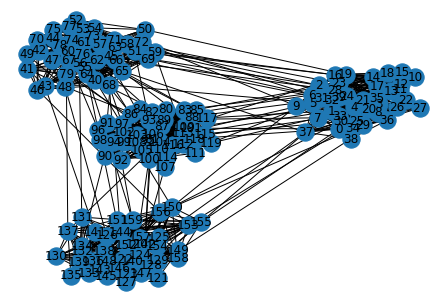

In [12]:
nx.draw(G, with_labels = True)

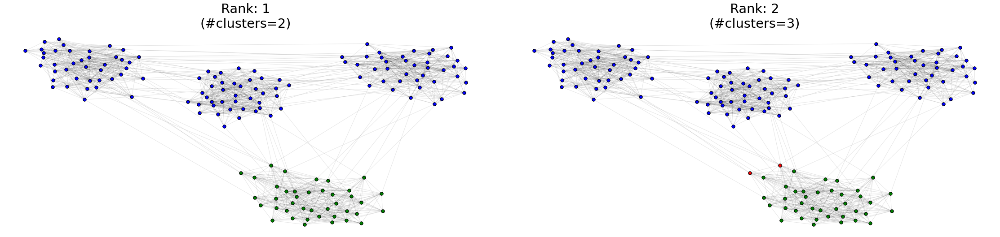

In [13]:
pos = nx.spring_layout(G)
plot_best_clusterings(G, D, 2, pos)

In [14]:
fig = ff.create_dendrogram(D)
fig.update_layout(width=800, height=500)
fig.show()

In [15]:
fig = ff.create_dendrogram(D, orientation='left')
fig.update_layout(width=800, height=800)
fig.show()

## Real data

In [16]:
G = nx.read_graphml("C:/Users/amin/Downloads/project computational and pattern/hierarchical/openstreet.graphml", node_type = int)
print(nx.info(G))

Name: Openstreet
Type: Graph
Number of nodes: 5993
Number of edges: 6958
Average degree:   2.3220


In [17]:
D=spectral(G)

In [18]:
pos_x = nx.get_node_attributes(G,'pos_x')
pos_y = nx.get_node_attributes(G,'pos_y')
pos = {u: (pos_x[u], pos_y[u]) for u in G.nodes()}

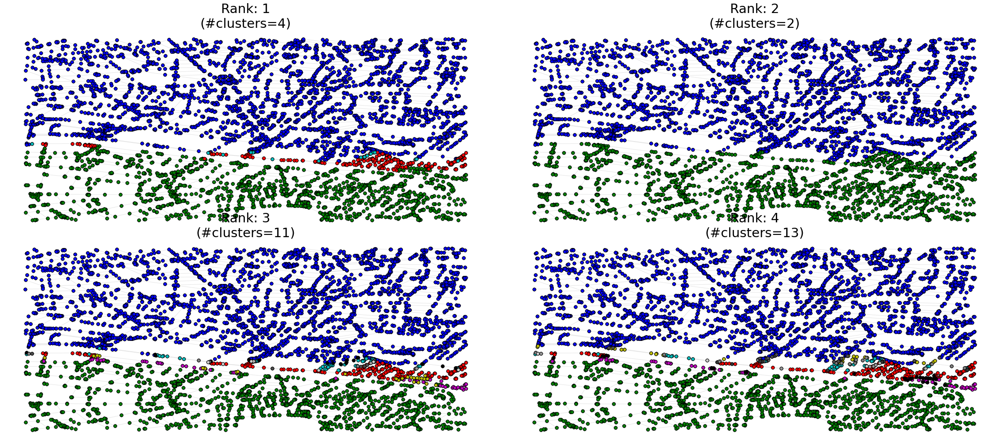

In [19]:
plot_best_clusterings(G, D, 4, pos)

In [20]:
fig = ff.create_dendrogram(D)
fig.update_layout(width=800, height=500)
fig.show()

In [21]:
fig = ff.create_dendrogram(D, orientation='left')
fig.update_layout(width=800, height=800)
fig.show()

## Performance

In [22]:
perf_algo(G,"spectral")

0.04245318877580998

## Running times

In [23]:
run_time_algo(G,"spectral")

3.32619047164917